In [19]:
!pip install -q mtcnn

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import os
import random

from tqdm import tqdm_notebook as tqdm
tqdm().pandas()

from PIL import Image
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC

from mtcnn.mtcnn import MTCNN

0it [00:00, ?it/s]

In [20]:
ALT_PATH = '/content/drive/MyDrive/sjsu/soccer-players/Mbappe/'


ALT_TRAIN_PATH = '/content/drive/MyDrive/sjsu/soccer-players/'

ALL_PATH = '/content/drive/MyDrive/sjsu/All/'

# Visualising the data

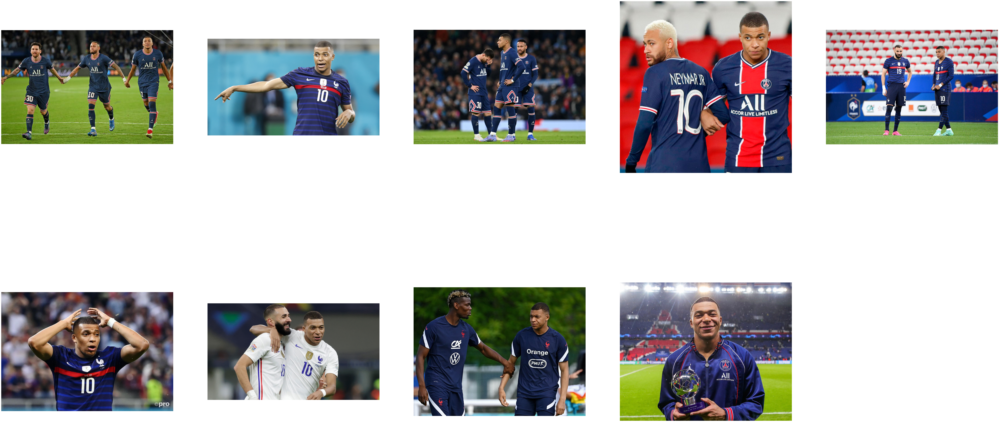

In [21]:
plt.figure(figsize=(100,50))
for i, filename in enumerate(os.listdir(ALT_PATH)):
    path = ALT_PATH + filename
    image = plt.imread(path)
    
    plt.subplot(2, 5, i+1)
    
    plt.axis('off')
    plt.imshow(image)
    
plt.show()

# Detecting faces and cropping them out using MtCNN (Multi Task Cascaded CNN)

An MT CNN network is a cascading style neural network, which is formed out of 3 smaller networks called P-net, R-net and O-net.
MT Cnn is suggested by creators of facenet for zoning in on faces for training

0it [00:00, ?it/s]

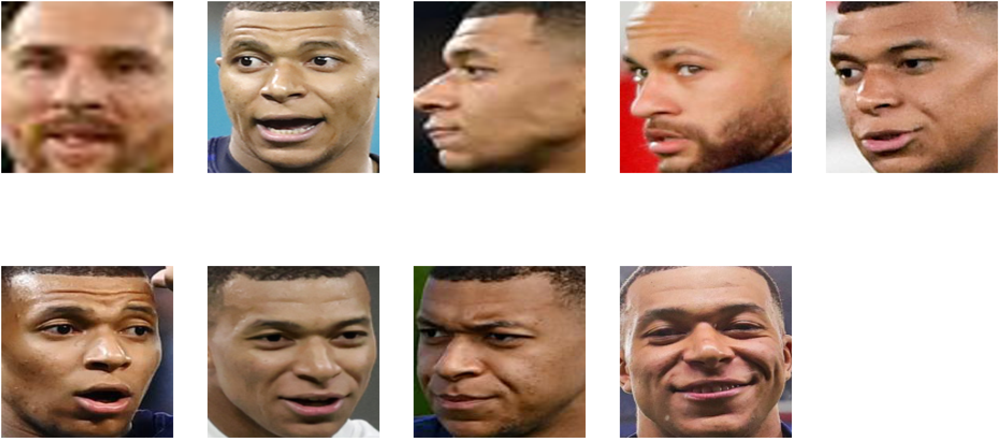

In [22]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(160, 160)):
    image = Image.open(filename)
    image = image.convert('RGB')
    pixels = np.asarray(image)
    
    detector = MTCNN()
    results = detector.detect_faces(pixels)
    
    # extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    # bug fix
    x1, y1 = abs(x1), abs(y1)
    
    x2, y2 = x1 + width, y1 + height
    
    face = pixels[y1:y2, x1:x2]
    
    image = Image.fromarray(face)
    
    image = image.resize(required_size)
    face_array = np.asarray(image)
    
    return face_array

plt.figure(figsize=(100,50))
for i, filename in tqdm(enumerate(os.listdir(ALT_PATH))):
    path = ALT_PATH + filename
    
    face = extract_face(path)
    
    #print(i+1, face.shape)
    
    plt.subplot(2, 5, i+1)
    
    plt.axis('off')
    plt.imshow(face)
    
plt.show()

# Loading the dataset

In [23]:
def load_faces(directory):
    faces = list()
    for file_name in tqdm(os.listdir(directory)):
        path = directory + file_name
        face = extract_face(path)
        
        faces.append(face)
    return faces

def load_dataset(directory):
    images, labels = list(), list()
    for folder in tqdm(os.listdir(directory)):
        path = directory + folder + '/'
        
        if not os.path.isdir(path):
            continue
        
        faces = load_faces(path)

        print(f'Celebrity : {folder}, Faces : {len(faces)}')

        label = [folder for _ in range(len(faces))]

        images.extend(faces)
        labels.extend(label)
        
    return np.asarray(images), np.asarray(labels)

In [24]:
X_train, y_train = load_dataset(ALT_TRAIN_PATH)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Celebrity : lewan, Faces : 6


  0%|          | 0/10 [00:00<?, ?it/s]

Celebrity : messi, Faces : 10


  0%|          | 0/10 [00:00<?, ?it/s]

Celebrity : kdb, Faces : 10


  0%|          | 0/10 [00:00<?, ?it/s]

Celebrity : haaland, Faces : 10


  0%|          | 0/10 [00:00<?, ?it/s]

Celebrity : salah, Faces : 10


  0%|          | 0/9 [00:00<?, ?it/s]

Celebrity : Mbappe, Faces : 9


  0%|          | 0/9 [00:00<?, ?it/s]

Celebrity : Neymar, Faces : 9


  0%|          | 0/8 [00:00<?, ?it/s]

Celebrity : suarez, Faces : 8


  0%|          | 0/11 [00:00<?, ?it/s]

Celebrity : misc, Faces : 11


  0%|          | 0/10 [00:00<?, ?it/s]

Celebrity : ramos, Faces : 10


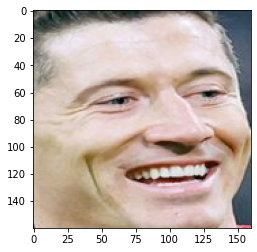

In [25]:
plt.imshow(X_train[0])

In [26]:
face_pixels = X_train[0]

print(face_pixels.shape)

face_pixels = np.expand_dims(face_pixels, axis=0)
print(face_pixels.shape)

(160, 160, 3)
(1, 160, 160, 3)


# Getting embeddings
We are using a pre trained facenet which is trained on MS-CELEB-1M dataset : https://exposing.ai/msceleb/


---



This training was made open source here: https://github.com/barisgecer/facenet



---

The backbone network for this facenet is inception-resnet-v1 : https://github.com/davidsandberg/facenet/blob/master/src/models/inception_resnet_v1.py

---

There are other pretrained models available as well over following datasets: 
---
VGGFace2 : https://github.com/ox-vgg/vgg_face2
---
CASIA-WebFace : https://paperswithcode.com/dataset/casia-webface#:~:text=The%20CASIA%2DWebFace%20dataset%20is,Mask%20using%20Multi%2Dscale%20GANs

In [27]:
from keras.models import load_model

def get_embedding(model, face_pixels):
    face_pixels = face_pixels.astype('float32')
    
    # standardize pixel values across channels (global) 
    mean, std = face_pixels.mean(), face_pixels.std() 
    face_pixels = (face_pixels - mean) / std
    
    samples = np.expand_dims(face_pixels, axis=0)
    
    yhat = model.predict(samples)
    
    return yhat[0]

model = load_model('/content/drive/MyDrive/sjsu/model/facenet_keras.h5')


trainX = list()


for pixels in tqdm(X_train):
    embedding = get_embedding(model, pixels)
    trainX.append(embedding)
trainX = np.asarray(trainX)


  0%|          | 0/93 [00:00<?, ?it/s]

# Display embeddings against face

[ 0.4544231   0.78956413  0.2278982   0.19889852  0.36446565  0.45605966
 -0.11277126  0.09811823  0.97089666  0.01369007  0.61728936  0.31842318
  0.0467586   0.74223506 -0.05277123  1.0391152   0.49594477  0.06300573
  0.511994    1.5430343   0.59285295  2.0698504  -0.55141157 -0.41475058
 -0.13819945  0.06251782  0.5231817  -0.32445103  0.03691905  1.0159508
 -0.68028665 -0.16729578 -0.6411109  -0.12751225 -0.7996691   0.1942172
 -1.2785301   0.16050085 -0.74949616 -0.9819424  -1.026633   -1.6274624
 -1.8492897  -1.7337402   1.1541752  -0.65692586 -0.02172168 -1.5154884
  2.429326   -0.44031814  0.1858232   0.60509056 -0.53101504 -2.4469345
 -0.6351848  -1.5362248   0.29820678 -0.30134025  0.5042485   0.749012
 -0.45569238  1.4772367   2.261184   -0.46126127  0.4010445  -0.72899103
  2.3626468  -0.35520592  0.05174412  1.65775     1.2255797  -1.3531178
  0.20599447  0.06951381  1.0954698  -1.1292241  -0.14876287 -0.30909252
 -0.3258648   0.21463524  0.5398915  -0.81194425 -0.2990003

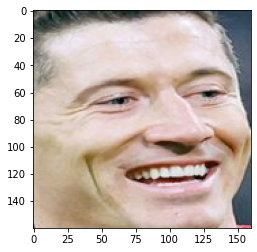

In [28]:
plt.imshow(X_train[0])
print(trainX[0])

# DBSCAN Clustering on embeddings

In [29]:
import sklearn.cluster as cluster
from sklearn.cluster import DBSCAN
from sklearn import metrics

In [30]:
y_pred = DBSCAN(eps=0.3, min_samples=10).fit_predict(trainX)

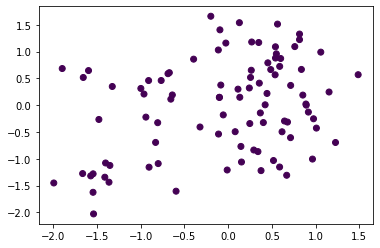

In [31]:
plt.scatter(trainX[:,0], trainX[:,1], c=y_pred)

# TSNE Clustering (t-distributed stochastic neighbor embedding)

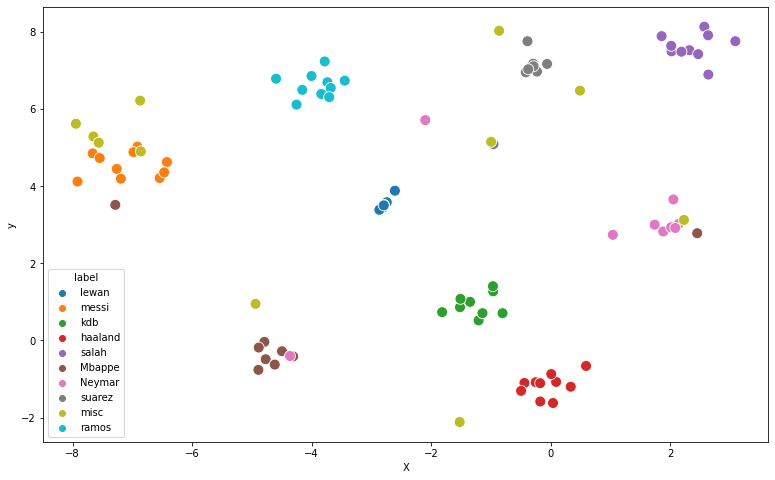

In [32]:
from sklearn.manifold import TSNE
import seaborn as sns

tsne = TSNE(learning_rate=100)

tsne_features = tsne.fit_transform(trainX)

X = tsne_features[:,0]
y = tsne_features[:,1]

dataset = pd.DataFrame(data=y_train, columns=['label'])
dataset['X'] = X
dataset['y'] = y


plt.figure(figsize=(13,8))
sns.scatterplot(data=dataset, x='X', y='y', hue='label', s=120)